In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import re

In [4]:
# prompt: connect to drive

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
from wordcloud import WordCloud
import nltk
from nltk.tokenize import word_tokenize
from collections import Counter

In [6]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [7]:
# Load data
data = pd.read_csv('/content/drive/MyDrive/Hackathon 24/train_original.csv')  # Replace with your actual file path

In [8]:
# Overview of dataset
print("Dataset Overview:")
print(data.info())


Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93686 entries, 0 to 93685
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   category            93686 non-null  object
 1   sub_category        87095 non-null  object
 2   crimeaditionalinfo  93665 non-null  object
dtypes: object(3)
memory usage: 2.1+ MB
None


In [9]:
print("\nSample Data:")
print(data.head(5))


Sample Data:
                                category                       sub_category  \
0  Online and Social Media Related Crime  Cyber Bullying  Stalking  Sexting   
1                 Online Financial Fraud                  Fraud CallVishing   
2               Online Gambling  Betting           Online Gambling  Betting   
3  Online and Social Media Related Crime                   Online Job Fraud   
4                 Online Financial Fraud                  Fraud CallVishing   

                                  crimeaditionalinfo  
0  I had continue received random calls and abusi...  
1  The above fraudster is continuously messaging ...  
2  He is acting like a police and demanding for m...  
3  In apna Job I have applied for job interview f...  
4  I received a call from lady stating that she w...  


\
We observed high data imbalance between multiple categories of train dataset. Like Catgory 0 -> "Online Financial Fraud" has 57434 samples while
Catgory 14 ->"Report Unlawful Content	" has only 1 sample, which may introduce Biasness for the category containing majority samples.




In [10]:
data['category'].value_counts().reset_index()

,category,count
0,Online Financial Fraud,57434
1,Online and Social Media Related Crime,12140
2,Any Other Cyber Crime,10878
3,Cyber Attack/ Dependent Crimes,3608
4,RapeGang Rape RGRSexually Abusive Content,2822
5,Sexually Obscene material,1838
6,Hacking Damage to computercomputer system etc,1710
7,Sexually Explicit Act,1552
8,Cryptocurrency Crime,480
9,Online Gambling Betting,444


In [11]:
data['sub_category'].value_counts().reset_index()

,sub_category,count
0,UPI Related Frauds,26856
1,Other,10878
2,DebitCredit Card FraudSim Swap Fraud,10805
3,Internet Banking Related Fraud,8872
4,Fraud CallVishing,5803
5,Cyber Bullying Stalking Sexting,4089
6,EWallet Related Fraud,4047
7,FakeImpersonating Profile,2299
8,Profile Hacking Identity Theft,2073
9,Cheating by Impersonation,1988


In [26]:
import plotly.express as px

# Create interactive pie chart
fig = px.pie(
    category_data,
    values='Count',
    names='Category',
    title='Category Distribution (% Contribution)',
    hole=0.3  # Makes it a donut chart for better readability
)
fig.show()


<ipython-input-27-8630cec96709>:35: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




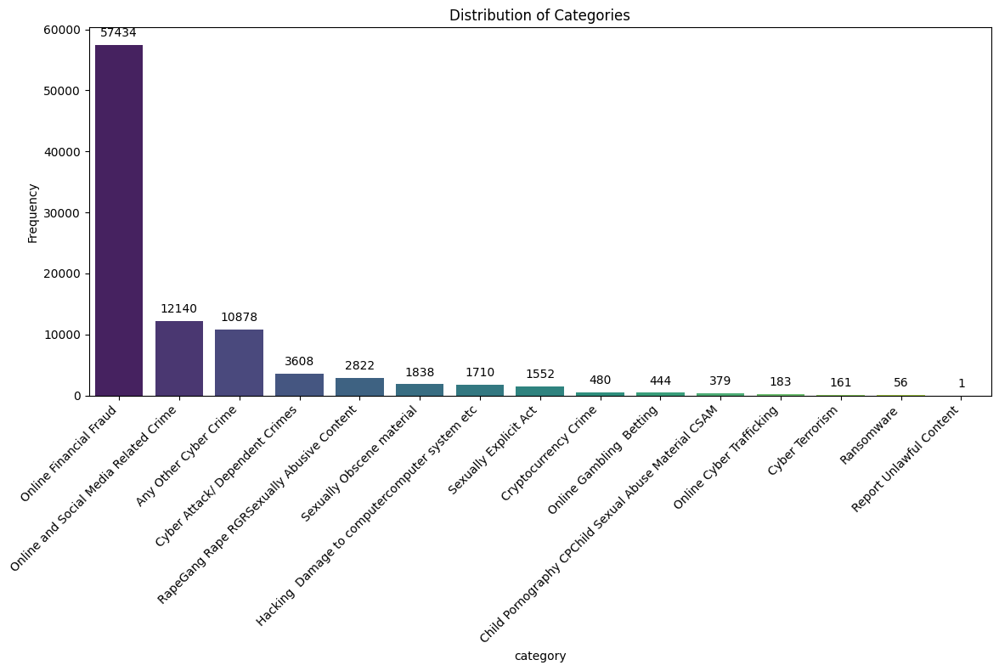

<ipython-input-27-8630cec96709>:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




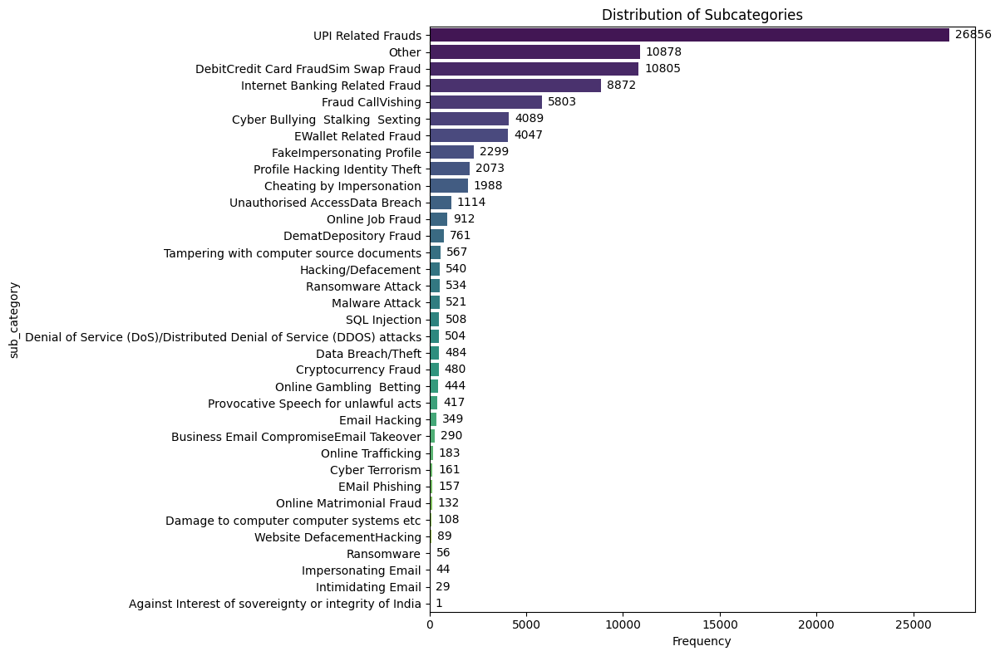

In [27]:
def plot_distribution(data, column, title, horizontal=False):
    """Plot distribution of a specified column with values on each bar."""
    plt.figure(figsize=(12, 8))

    # Prepare data for plotting
    value_counts = data[column].value_counts().reset_index()
    value_counts.columns = [column, 'Frequency']

    # Check orientation
    if horizontal:
        # Plot horizontal bars for better readability with long labels
        ax = sns.barplot(
            y=column,
            x='Frequency',
            data=value_counts,
            palette='viridis',
            orient='h'
        )

        # Add frequency values next to each bar for horizontal orientation
        for p in ax.patches:
            ax.annotate(f"{p.get_width():.0f}",
                        (p.get_width(), p.get_y() + p.get_height() / 2),
                        ha='left',
                        va='center',
                        fontsize=10,
                        color='black',
                        xytext=(5, 0),
                        textcoords='offset points')
        plt.xlabel("Frequency")
        plt.ylabel(column)

    else:
        # Plot vertical bars if horizontal=False
        ax = sns.barplot(
            x=column,
            y='Frequency',
            data=value_counts,
            palette='viridis'
        )

        # Add frequency values on top of each bar for vertical orientation
        for p in ax.patches:
            ax.annotate(f"{p.get_height():.0f}",
                        (p.get_x() + p.get_width() / 2, p.get_height()),
                        ha='center',
                        va='bottom',
                        fontsize=10,
                        color='black',
                        xytext=(0, 5),
                        textcoords='offset points')
        plt.xlabel(column)
        plt.ylabel("Frequency")
        plt.xticks(rotation=45, ha='right')

    plt.title(title)
    plt.tight_layout()
    plt.show()

# Call the function with horizontal=False for categories
plot_distribution(data, 'category', 'Distribution of Categories')

# Call the function with horizontal=True for subcategories
plot_distribution(data, 'sub_category', 'Distribution of Subcategories', horizontal=True)


In [28]:
data_test = pd.read_csv('/content/drive/MyDrive/Hackathon 24/test_original.csv')  # Replace with your actual file path

In [29]:
print("Dataset Overview:")
print(data_test.info())

Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31229 entries, 0 to 31228
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   category            31229 non-null  object
 1   sub_category        28993 non-null  object
 2   crimeaditionalinfo  31222 non-null  object
dtypes: object(3)
memory usage: 732.1+ KB
None


In [30]:
data_test['category'].value_counts().reset_index()

,category,count
0,Online Financial Fraud,18896
1,Online and Social Media Related Crime,4139
2,Any Other Cyber Crime,3670
3,Cyber Attack/ Dependent Crimes,1261
4,RapeGang Rape RGRSexually Abusive Content,912
5,Sexually Obscene material,666
6,Hacking Damage to computercomputer system etc,592
7,Sexually Explicit Act,535
8,Cryptocurrency Crime,166
9,Online Gambling Betting,134


In [31]:
data_test['sub_category'].value_counts().reset_index()

,sub_category,count
0,UPI Related Frauds,8890
1,Other,3670
2,DebitCredit Card FraudSim Swap Fraud,3556
3,Internet Banking Related Fraud,2973
4,Fraud CallVishing,1827
5,Cyber Bullying Stalking Sexting,1366
6,EWallet Related Fraud,1338
7,FakeImpersonating Profile,763
8,Profile Hacking Identity Theft,751
9,Cheating by Impersonation,719


In [32]:
import pandas as pd
import plotly.express as px

# Assuming the data from your snippet
category_data = data_test['category'].value_counts().reset_index()
category_data.columns = ['Category', 'Count']  # Rename columns for clarity

# Create an interactive pie chart
fig = px.pie(
    category_data,
    values='Count',         # Specify the values for the pie slices
    names='Category',       # Specify the names/labels for the pie slices
    title='Category-wise Distribution (% Contribution)',  # Set chart title
    hole=0.3                # Create a donut chart
)

# Show the chart
fig.show()


***Our Observation was the test dataset contains an additional category named  Crime Against Women & Children***, which has 4 samples but was not included in the training dataset. Additionally, we appended this category to the original dataset. To resolve the data imbalance problem, we generated the synthetic samples of under_sampled categories. So new train dataset looks like following:

In [33]:
data2 = pd.read_csv('/content/drive/MyDrive/Hackathon 24/cleaned_train_dataset1.csv')  # Replace with your actual file path

In [34]:
data2['category'].value_counts().reset_index()

,category,count
0,Online Financial Fraud,52801
1,Online and Social Media Related Crime,11714
2,Any Other Cyber Crime,10584
3,Cyber Attack/ Dependent Crimes,3608
4,RapeGang Rape RGRSexually Abusive Content,2816
5,Report Unlawful Content,1844
6,Sexually Obscene material,1797
7,Hacking Damage to computercomputer system etc,1664
8,Sexually Explicit Act,1510
9,Crime Against Women & Children,1320


In [35]:
data2['sub_category'].value_counts().reset_index()

,sub_category,count
0,UPI Related Frauds,24099
1,Other,10946
2,DebitCredit Card FraudSim Swap Fraud,10011
3,Internet Banking Related Fraud,8146
4,Fraud CallVishing,5640
5,Cyber Bullying Stalking Sexting,3955
6,EWallet Related Fraud,3898
7,FakeImpersonating Profile,2215
8,Profile Hacking Identity Theft,1989
9,Cheating by Impersonation,1922


In [36]:
import pandas as pd
import plotly.express as px

# Assuming the data from your snippet
category_data = data2['category'].value_counts().reset_index()
category_data.columns = ['Category', 'Count']  # Rename columns for clarity

# Create an interactive pie chart
fig = px.pie(
    category_data,
    values='Count',         # Specify the values for the pie slices
    names='Category',       # Specify the names/labels for the pie slices
    title='Category-wise Distribution (% Contribution)',  # Set chart title
    hole=0.3                # Create a donut chart
)

# Show the chart
fig.show()

## WordCloud is representig the moat dominating words in each category. Hence Categorywise wordcloud is represented for both train as well as for test data.

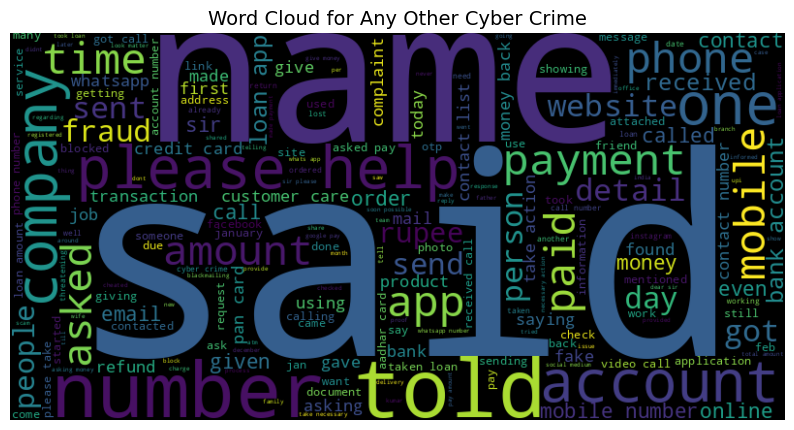

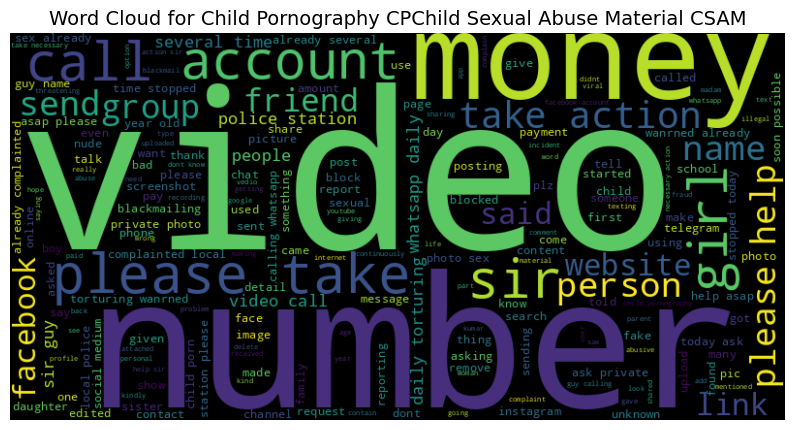

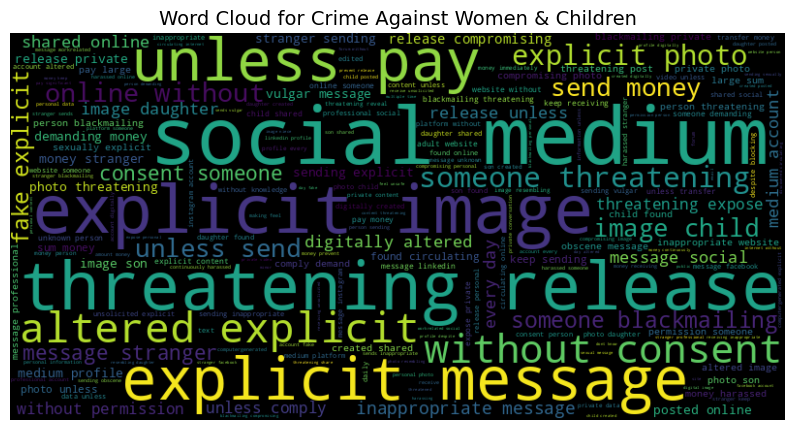

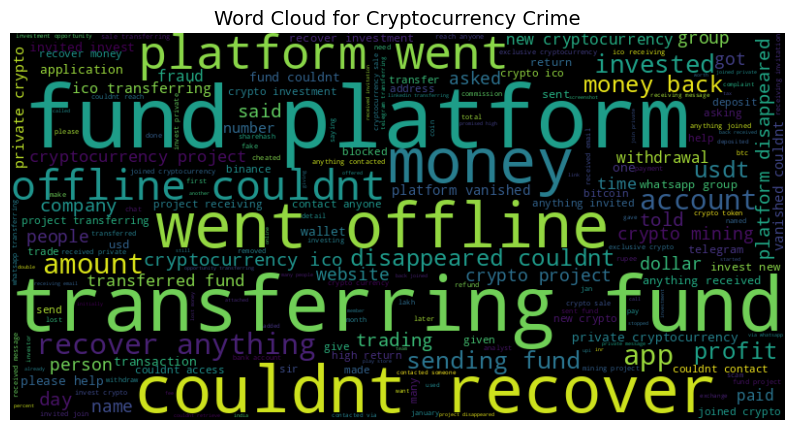

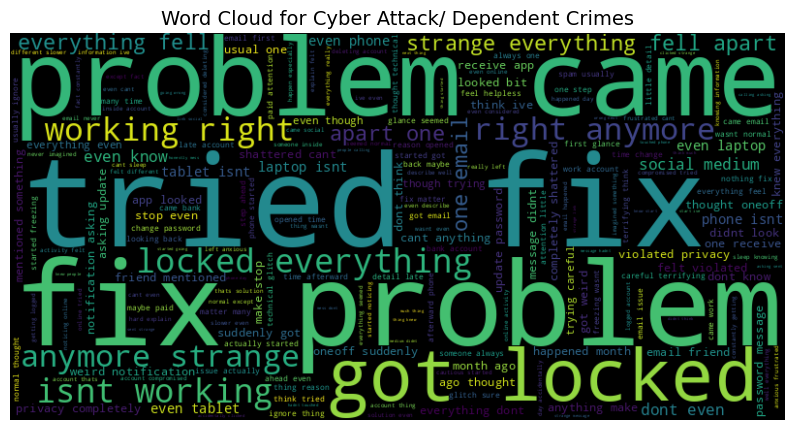

...

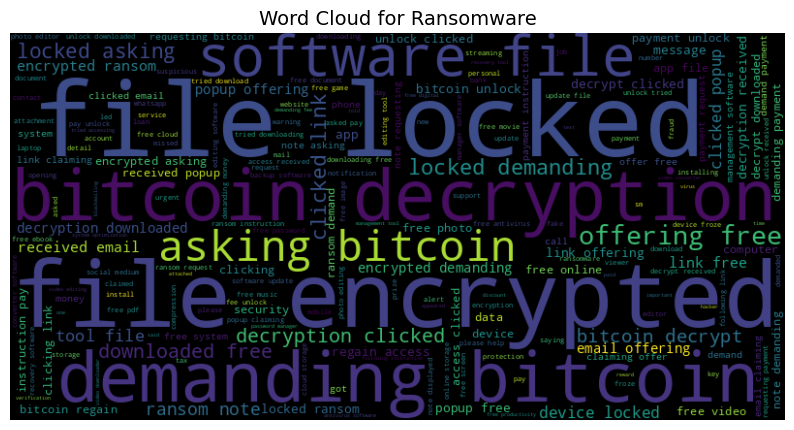

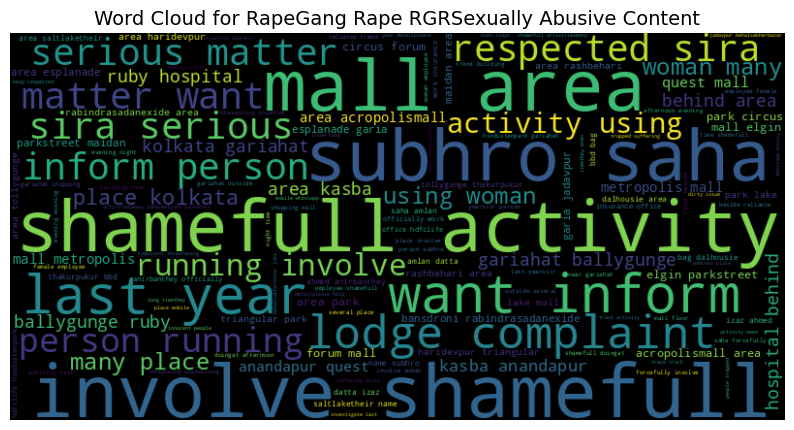

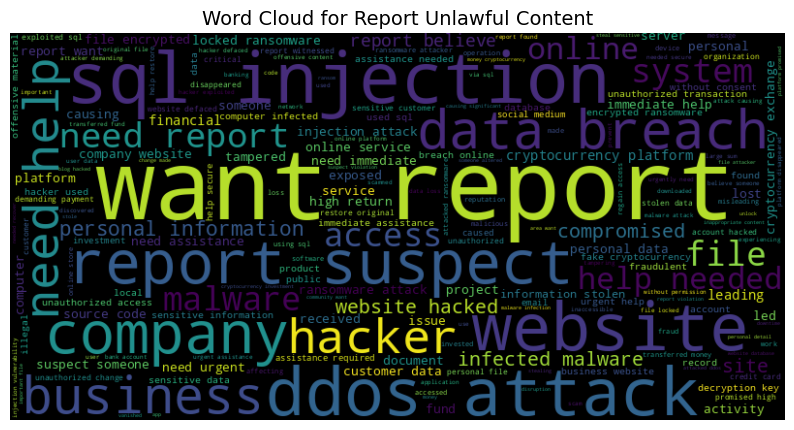

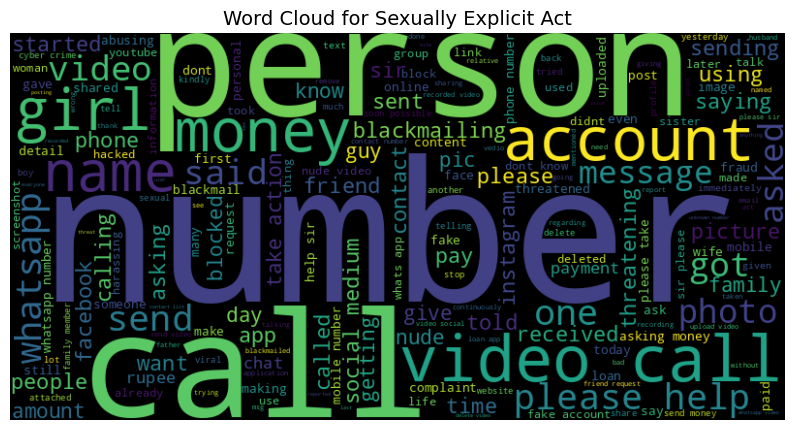

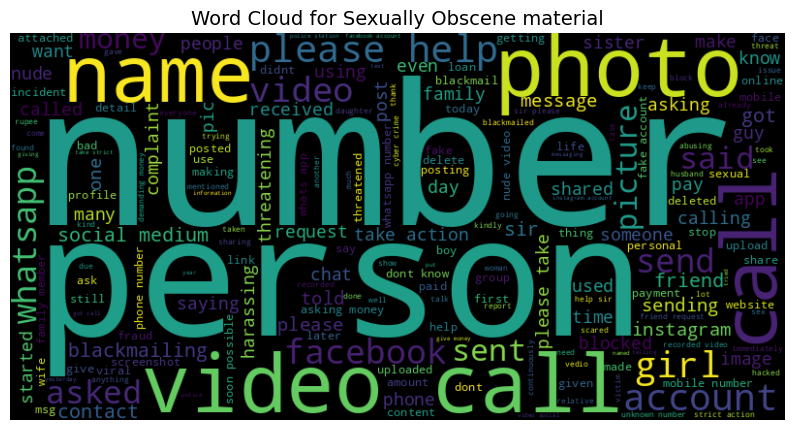

In [44]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming your dataset is in 'data_test'
# Ensure all entries in 'crimeaditionalinfo' are strings
data2['English Senetences'] = data2['English Senetences'].fillna('').astype(str)

# Group by category and combine text
category_texts = data2.groupby('category')['English Senetences'].apply(' '.join).reset_index()

# Generate word clouds for each category
for _, row in category_texts.iterrows():
    category = row['category']
    text = row['English Senetences']

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)

    # Plot the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {category}', fontsize=14)
    plt.show()


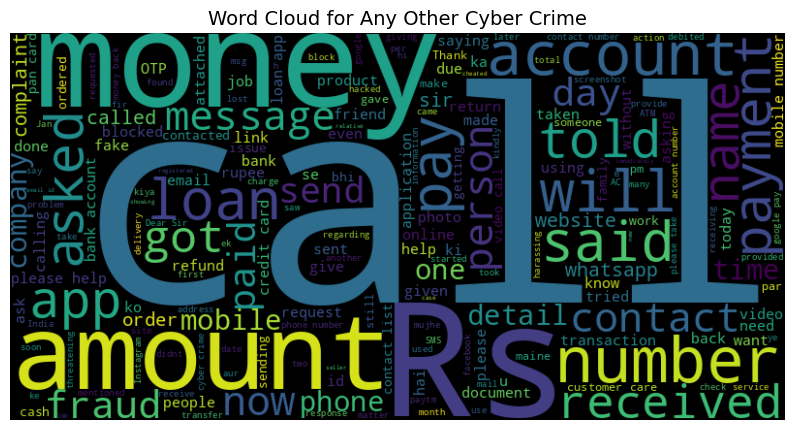

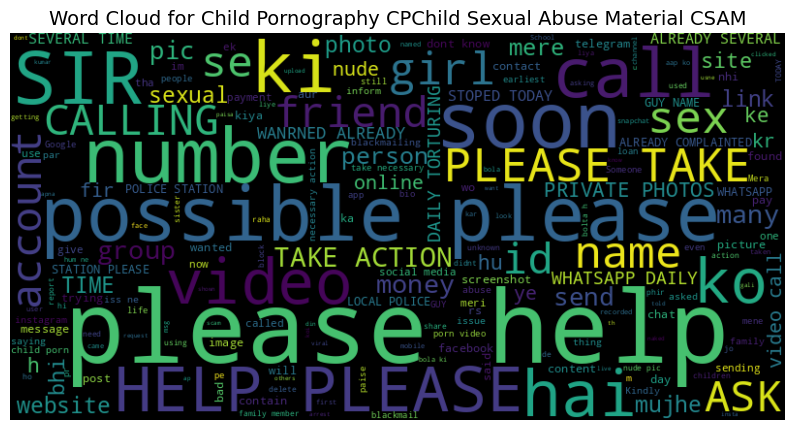

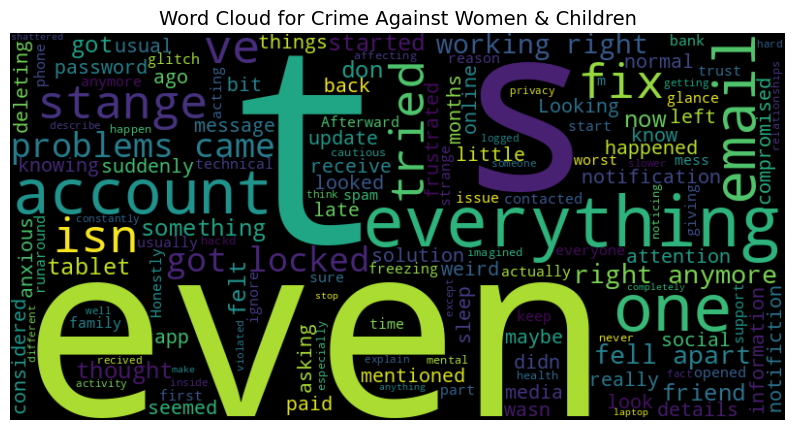

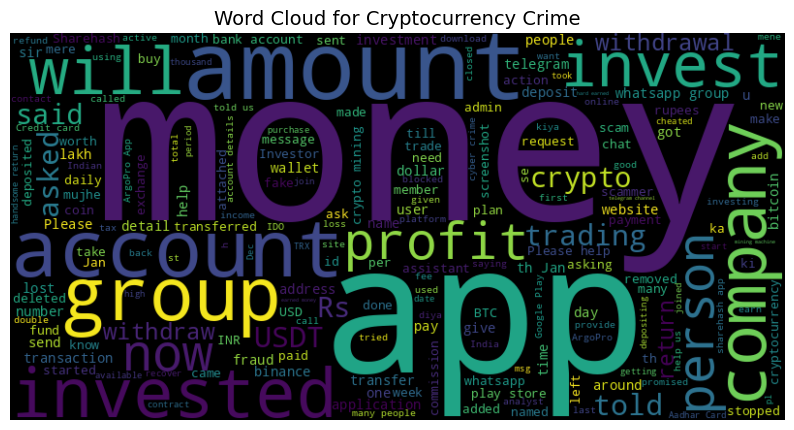

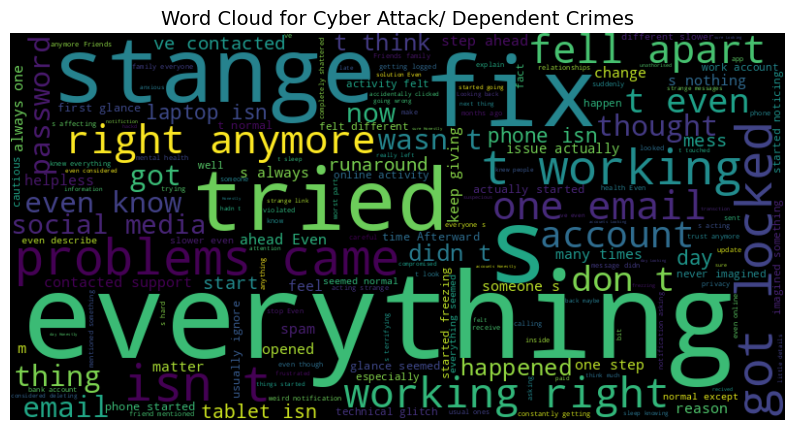

...

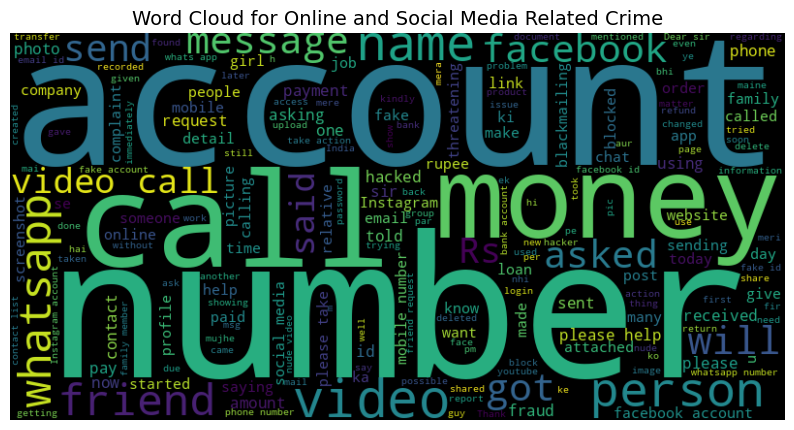

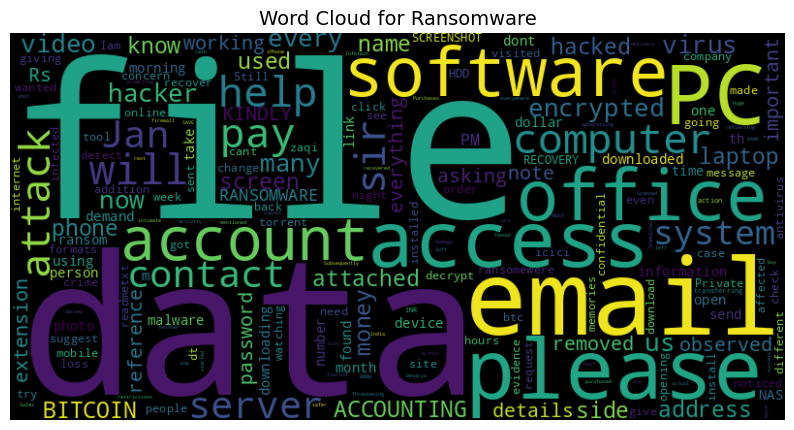

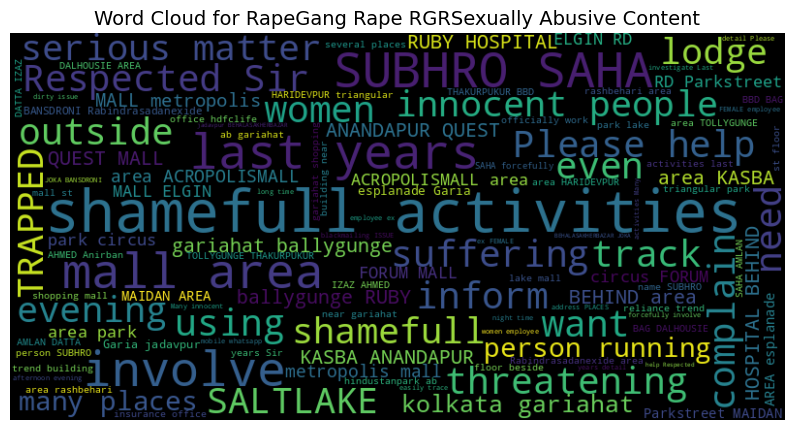

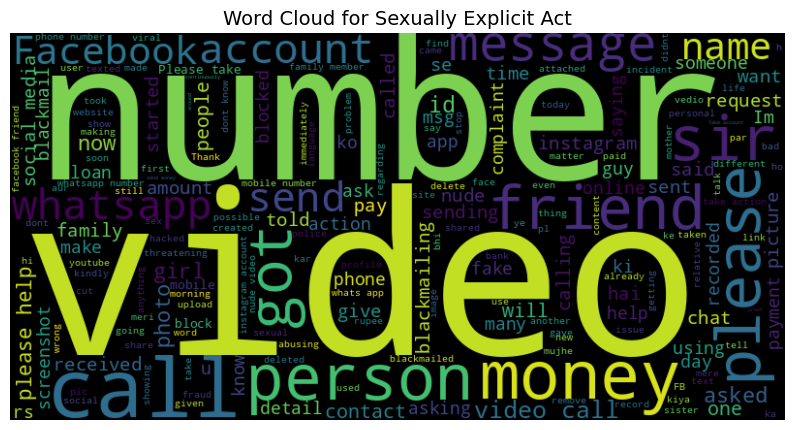

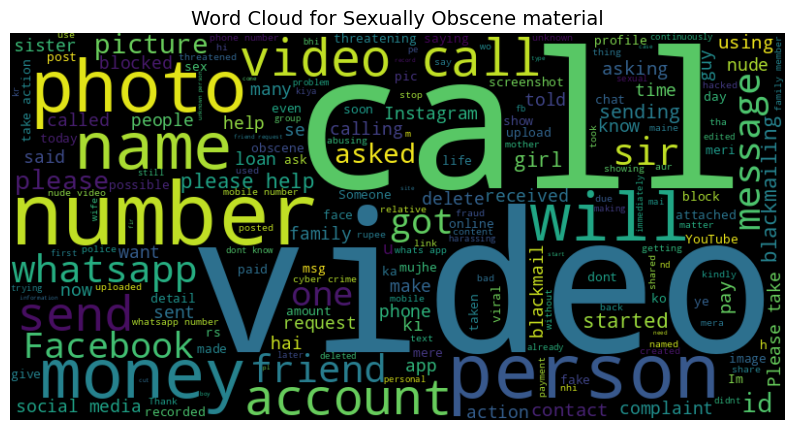

In [45]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming your dataset is in 'data_test'
# Ensure all entries in 'crimeaditionalinfo' are strings
data_test['crimeaditionalinfo'] = data_test['crimeaditionalinfo'].fillna('').astype(str)

# Group by category and combine text
category_texts = data_test.groupby('category')['crimeaditionalinfo'].apply(' '.join).reset_index()

# Generate word clouds for each category
for _, row in category_texts.iterrows():
    category = row['category']
    text = row['crimeaditionalinfo']

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)

    # Plot the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {category}', fontsize=14)
    plt.show()


In [ ]:
def get_most_common_words(text_series, top_n=20):
    """Get the most common words in a pandas Series of text data."""
    # Fill NaN with empty strings and convert to string
    all_text = ' '.join(text_series.fillna('').astype(str))
    words = re.findall(r'\b\w+\b', all_text.lower())  # Convert to lowercase for consistency
    return Counter(words).most_common(top_n)

In [ ]:
# Display top 20 words
most_common_words = get_most_common_words(data['cleaned_text'])

# Display the top 20 most common words
print("\nTop 20 Most Common Words:")
for word, freq in most_common_words:
    print(f"{word}: {freq}")


Top 20 Most Common Words:
and: 202807
i: 189935
the: 154834
to: 148807
my: 124488
me: 86827
a: 78315
of: 77153
in: 73115
that: 61663
account: 60955
is: 59050
they: 56546
from: 56181
amount: 56004
he: 55998
for: 51310
on: 51175
this: 51061
bank: 45879


<ipython-input-20-548d9e1d8aaf>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=word_df, x='Word', y='Frequency', palette='viridis')


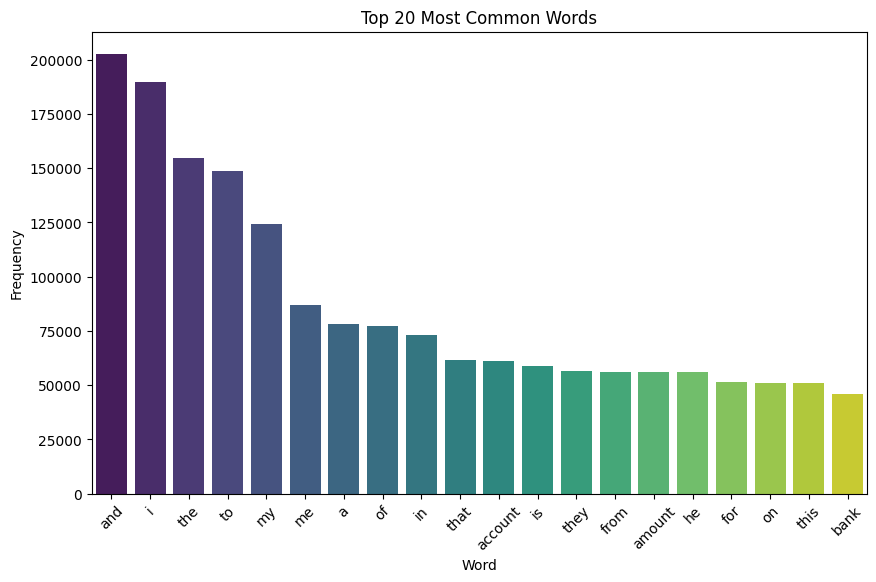

In [ ]:
# 5. Visualization of Common Words (Optional)
word_df = pd.DataFrame(most_common_words, columns=['Word', 'Frequency'])
plt.figure(figsize=(10, 6))
sns.barplot(data=word_df, x='Word', y='Frequency', palette='viridis')
plt.title('Top 20 Most Common Words')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# 2. Handling Missing Values
# Check for missing values
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100
print("\nMissing Data Summary:")
print(pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage}))


Missing Data Summary:
                    Missing Values  Percentage
category                         0    0.000000
sub_category                  6591    7.035203
crimeaditionalinfo              21    0.022415
cleaned_text                    21    0.022415
text_length                      0    0.000000


In [ ]:
# Drop rows where 'crimeaditionalinfo' is missing
data_cleaned = data.dropna(subset=['crimeaditionalinfo']).copy()


In [ ]:
# 3. Handling Duplicates
# Check for duplicates
duplicate_rows = data_cleaned.duplicated().sum()
print(f"\nNumber of duplicate rows: {duplicate_rows}")


Number of duplicate rows: 7789


In [ ]:
# Drop duplicate rows if any
data_cleaned = data_cleaned.drop_duplicates()
print(f"Data shape after removing duplicates: {data_cleaned.shape}")

Data shape after removing duplicates: (85876, 5)


In [ ]:
# 4. Sentence Length Analysis
# Calculate word count for each sentence in 'crimeaditionalinfo'
data_cleaned['word_count'] = data_cleaned['crimeaditionalinfo'].apply(lambda x: len(word_tokenize(x)))


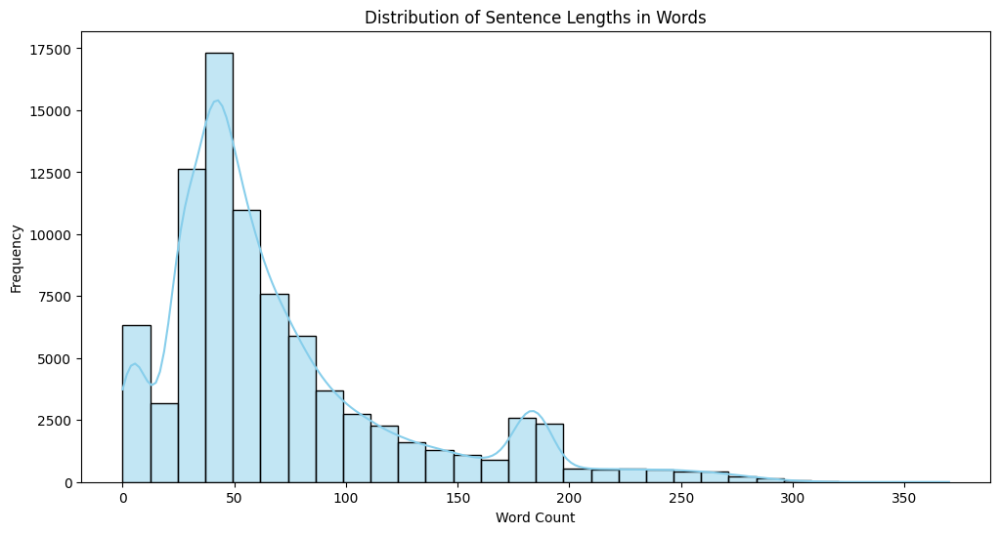

In [ ]:
# Plot the distribution of sentence lengths
plt.figure(figsize=(12, 6))
sns.histplot(data_cleaned['word_count'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Sentence Lengths in Words')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# 5. Most Common Words
# Tokenize all sentences and create a frequency distribution
all_words = [word for text in data_cleaned['crimeaditionalinfo'] for word in word_tokenize(text)]
word_counts = Counter(all_words)

In [ ]:
# Plot the top 20 most common words
common_words = word_counts.most_common(20)
common_words_df = pd.DataFrame(common_words, columns=['Word', 'Frequency'])

<ipython-input-35-7ad241b53d47>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Word', y='Frequency', data=common_words_df, palette='viridis')


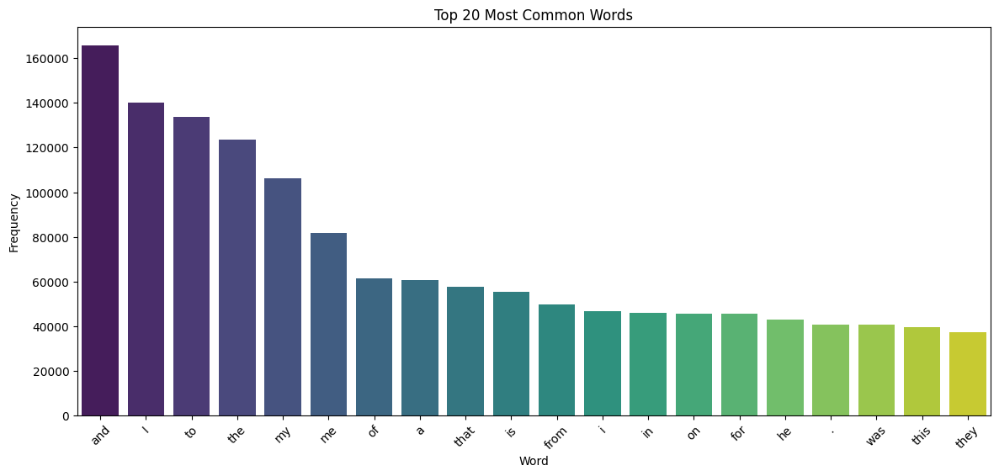

In [ ]:
plt.figure(figsize=(14, 6))
sns.barplot(x='Word', y='Frequency', data=common_words_df, palette='viridis')
plt.title('Top 20 Most Common Words')
plt.xticks(rotation=45)
plt.show()

<ipython-input-38-213b3f48699c>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='sub_category', data=data_cleaned.dropna(subset=['sub_category']),


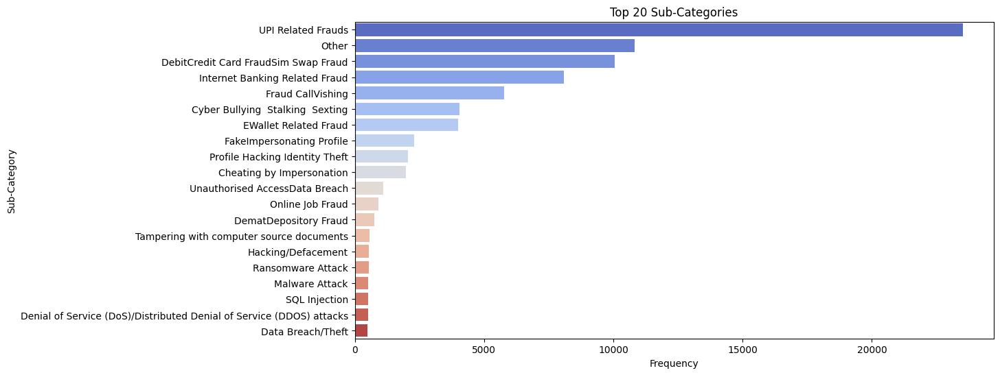

In [ ]:
# 8. Sub-Category Distribution (Optional)
# Plot distribution of 'sub_category', excluding missing values
if 'sub_category' in data_cleaned.columns:
    plt.figure(figsize=(12, 6))
    sns.countplot(y='sub_category', data=data_cleaned.dropna(subset=['sub_category']),
                  order=data_cleaned['sub_category'].value_counts().index[:20], palette='coolwarm')
    plt.title('Top 20 Sub-Categories')
    plt.xlabel('Frequency')
    plt.ylabel('Sub-Category')
    plt.show()

Further Text Preprocessing

In [ ]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import re

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

In [ ]:
def preprocess_text(text):
    # Text cleaning: remove special characters and convert to lowercase
    text = re.sub(r'\W', ' ', str(text))
    text = text.lower()

    # Tokenization
    tokens = text.split()

    # Stop word removal and stemming
    processed_tokens = [
        stemmer.stem(word) for word in tokens if word not in stop_words
    ]

    # Join tokens back into a single string
    return ' '.join(processed_tokens)

In [ ]:
# Apply preprocessing to the 'crimeaditionalinfo' column
data['processed_text'] = data['crimeaditionalinfo'].apply(preprocess_text)

In [ ]:
# Display the processed data
print(data[['crimeaditionalinfo', 'processed_text']].head())

                                  crimeaditionalinfo  \
0  I had continue received random calls and abusi...   
1  The above fraudster is continuously messaging ...   
2  He is acting like a police and demanding for m...   
3  In apna Job I have applied for job interview f...   
4  I received a call from lady stating that she w...   

                                      processed_text  
0  continu receiv random call abus messag whatsap...  
1  fraudster continu messag ask pay money send fa...  
2  act like polic demand money ad section text me...  
3  apna job appli job interview telecal resourc m...  
4  receiv call ladi state send new phone vivo rec...  


In [ ]:
# Drop rows where 'crimeaditionalinfo' is missing
data_cleaned = data.dropna(subset=['processed_text']).copy()


In [ ]:
# 3. Handling Duplicates
# Check for duplicates
duplicate_rows = data_cleaned.duplicated().sum()
print(f"\nNumber of duplicate rows: {duplicate_rows}")


Number of duplicate rows: 7803


In [ ]:
# Drop duplicate rows if any
data_cleaned = data_cleaned.drop_duplicates()
print(f"Data shape after removing duplicates: {data_cleaned.shape}")

Data shape after removing duplicates: (85883, 6)


In [ ]:
# 5. Most Common Words
# Tokenize all sentences and create a frequency distribution
all_words = [word for text in data_cleaned['processed_text'] for word in word_tokenize(text)]
word_counts = Counter(all_words)

In [ ]:
# Plot the top 20 most common words
common_words = word_counts.most_common(20)
common_words_df = pd.DataFrame(common_words, columns=['Word', 'Frequency'])

<ipython-input-57-7ad241b53d47>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Word', y='Frequency', data=common_words_df, palette='viridis')


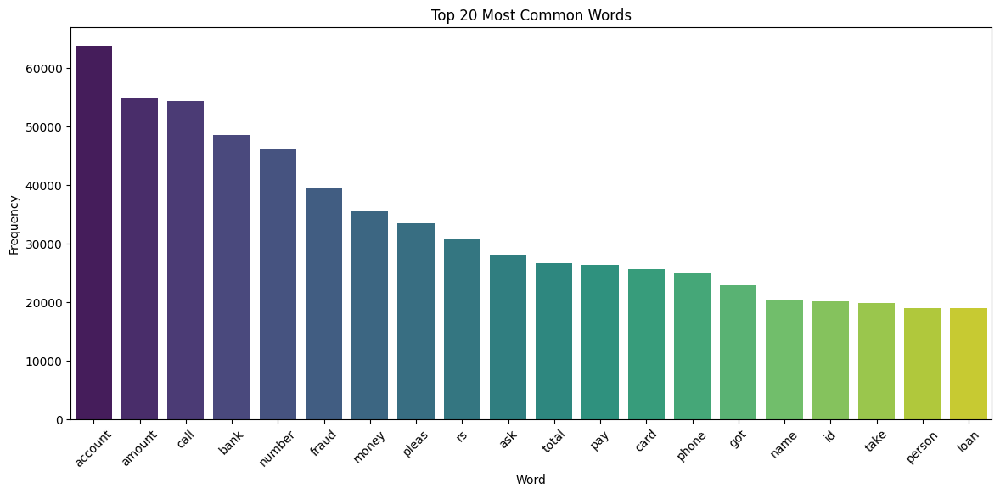

In [ ]:
plt.figure(figsize=(14, 6))
sns.barplot(x='Word', y='Frequency', data=common_words_df, palette='viridis')
plt.title('Top 20 Most Common Words')
plt.xticks(rotation=45)
plt.show()

### While performing Data Analysis we found certain challenges in the data:The dataset provided posed numerous challenges during the processing and analysis stages. Here is a detailed explanation of the challenges encountered and the solutions we implemented:

Challenge 1: Multilingual Nature of the Dataset
The dataset was initially multilingual, comprising entries in languages such as English and Hinglish. This presented a significant challenge in standardizing the data into a single language for consistent processing.

Solution:
To address this, we leveraged Google Sheets' built-in Google Translate feature to convert the entire dataset into a common language. This approach yielded more accurate results compared to using Python scripts that call the Google Translate API or other language classification/translation models. The ease of use and improved accuracy of this feature helped streamline this step effectively.
Challenge 2: Data Cleaning
Once the dataset was standardized to a single language, the next hurdle was cleaning the data, which contained numerous noisy elements such as irrelevant words, stopwords, URLs, and other non-linguistic characters.

Solution:
A comprehensive text-cleaning process was performed, which included:
Converting all text to lowercase.
Removing URLs, punctuations, newline characters, and other non-word symbols (except periods).
Eliminating words containing numbers.
Tokenizing the text into individual words.
Performing lemmatization to reduce words to their base forms. We avoided Porter stemming as it significantly altered the meaning of words, and lemmatization provided more accurate results.
Removing short words with a length of two characters or less.
Expanding abbreviations to their full forms for better semantic understanding. For instance, abbreviations like “ASAP” were converted to “as soon as possible” and “FYI” to “for your information”.
Despite these cleaning efforts, some limitations persisted in the resulting dataset.

Remaining Issues and Final Adjustment
After the cleaning process, certain columns in the dataset were found to be problematic. Specifically:

Some columns were empty.
Some columns contained only a single word element, which added little value to the analysis.
To address these issues:

We identified and removed the problematic rows from the dataset.
Initial number of rows: 101,179
Problematic rows: 1,631
These 1,631 rows were removed, resulting in a refined dataset.
This multi-step process ensured that the dataset was better prepared for subsequent analysis, significantly reducing noise and standardizing the data for better usability.
